<a href="https://colab.research.google.com/github/scudilio/perfil_inadimplentes_BNDES-/blob/main/Script_EDA_Financiamentos_do_BNDES.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

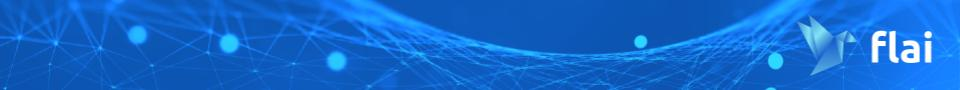

# **Financiamentos do BNDES - Banco Nacional de Desenvolvimento Econômico e Social**
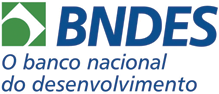

## **Entendendo o contexto**

1. **Quem é o BNDES**;
2. **O Dataset**;
2. **Porque fazer essa AED?**


### **Quem é o BNDES**

De acordo com a página [**"Quem somos"**](https://www.bndes.gov.br/wps/portal/site/home/quem-somos) do site do BNDES:

Fundado em 1952, o **Banco Nacional de Desenvolvimento Econômico e Social (BNDES) é um dos maiores bancos de desenvolvimento do mundo** e, hoje, o **principal instrumento do Governo Federal para o financiamento** de longo prazo **e investimento em todos os segmentos da economia brasileira**.

Para isso, **apoia empreendedores de todos os portes**, **inclusive pessoas físicas**, na realização de seus planos de modernização, de expansão e na concretização de novos negócios, tendo sempre em vista o potencial de geração de empregos, renda e de inclusão social para o Brasil.

O apoio do BNDES ocorre **por meio de financiamento a investimentos**, subscrição de valores mobiliários, prestação de garantia e concessão de recursos não reembolsáveis a projetos de caráter social, cultural e tecnológico. O Banco atua por meio de produtos, programas e fundos, conforme a modalidade e a característica das operações.

**Por ser uma empresa pública e não um banco comercial**, o **BNDES avalia a concessão do apoio com foco no impacto socioambiental e econômico no Brasil.** **Incentivar a inovação, o desenvolvimento regional e o desenvolvimento socioambiental são prioridades para a instituição.** 

O BNDES **oferece condições especiais para micro, pequenas e médias empresas**, aquelas que faturam anualmente até R$ 300 milhões, assim como **linhas de investimentos sociais, direcionadas para educação e saúde, agricultura familiar, saneamento básico e transporte urbano**.

Em situações de crise, o Banco também tem fundamental atuação anticíclica e auxilia na formulação das soluções para a retomada do crescimento da economia. O **BNDES está presente para apoiar o crescimento do País onde é necessário**.


In [ ]:
from IPython.core.display import HTML
HTML('<iframe width="1000" height="500" src="https://www.youtube.com/embed/teMf3B05g78" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')

### **O Dataset**

No portal de dados abertos do BNDES, encontra-se disponível uma área com disponibilidade para download de dois arquivos de microdados de operações financeiras: operações indiretas automáticas e operações não automáticas. Neste segundo arquivo contém tanto as operações diretas (contratadas diretamente com o BNDES) quanto as indiretas (contratadas através de agentes financeiros). As não automáticas são as que 2 necessitam de análise de um Analista do BNDES, e geralmente são as operações de valores maiores.

Nesses conjuntos de dados cada instância é uma operação financeira de financiamento e contém atributos da:

- **empresa:** nome da empresa, CNPJ, municípios e UF onde estão localizados a
empresa, natureza da empresa se é pública ou privada, se for pública se é da esfera federal, estadual ou municipal, porte da empresa (se pequena, média ou grande), Qual setor de atividade econômica da empresa (CNAE com setor e subsetor);
- **forma de negociação:** se direta ou indireta, se indireta qual foi o agente financeiro, qual foi o tipo de garantia da operação;
- **sobre a contratação:** qual tipo de produto BNDES foi contratado, qual instrumento financeiro utilizado, se era para um projeto de inovação, qual área operacional do BNDES tratou desta operação financeira;
- **sobre o financiamento:** Valor contratado, taxa de juros, custo financeiro, prazo de carência, prazo para amortização, modalidade de apoio; situação do financiamento na data da última atualização do dataset (se liquidado ou ativo).



Link para download dos dois arquivos csv contendo os microdados:
- https://dadosabertos.bndes.gov.br/dataset/operacoes-financiamento/resource/9534f677-9525-4bf8-a3aa-fd5d3e152a93
- https://dadosabertos.bndes.gov.br/dataset/operacoes-financiamento/resource/332d446e-d340-46ef-af64-ee6f36e7bd50

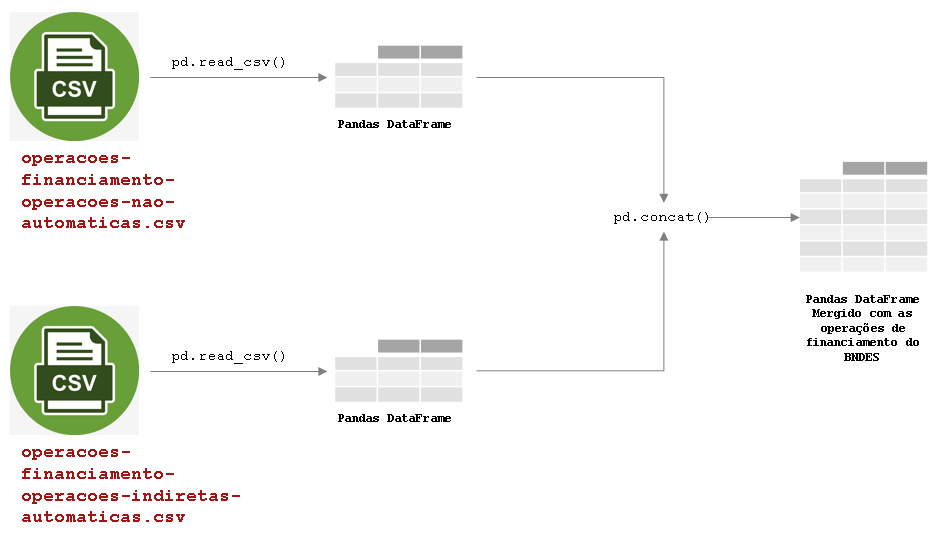

### **Porque fazer essa AED?**

Ao se candidatar para uma vaga de junior data analyst em um Banco, você se deparou com o seguinte case: Analisar, utilizando o Python, as operações de financiamentos do BNDES. Essas análises serão entregues para um novo Gestor deste Banco que precisa ter um panorama dessas operações de financiamento para iniciar seus trabalhos e realizou a seguintes perguntas:

1. As contratações de operações de financimentos do BNDES ocorrem principalmente em quais produtos, com quais condições pagamentos e com qual volume de recursos financeiros?

2. Qual perfil dos clientes que realizam operações de financiamentos junto ao BNDES? São Empresas de qual porte, de qual setor da economia? São da esfera pública ou privadas?

3. A origem, porte, localização e setor das empresas contratantes influenciam de qual forma nos tipos de produtos, volume das contratações e condições de pagamentos dos financimentos realizados junto ao BNDES?

4. O BNDES apoia inovação de empresas, em que, de acordo com este banco: “Uma inovação é a implementação de um produto (bem ou serviço) novo ou significativamente melhorado, ou um processo, ou um novo método de marketing, ou um novo método organizacional nas práticas de negócios, na organização do local de trabalho ou nas relações externas.”. Existem condições especiais para os financimentos para inovação? Qual perfil de empresa contratam financiamento para inovação?

## **Hands-on**

1. **Preparar o ambiente**;
2. **Carregar dados**;
3. **Entender a estrutura dos dados**;
4. **Transformar dados**;
5. **Elaboração de tabelas, gráficos e estatísticas**.

### **Preparando ambiente**

In [ ]:
# importando as bibliotecas necessarias
import numpy as np 
import pandas as pd 
import seaborn as sns
from matplotlib.cbook import boxplot_stats
import matplotlib.pyplot as plt
import folium
import json

In [ ]:
# Permitir o Google Colab utilizar arquivos do Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Carregando dados**

Carregamento via Google Drive. Você deve baixar os dados e colocá-los em seu drive para fazer a importação da maneira mais conveniente para o Colab. 

In [ ]:
# importando o conjunto de dados de operacos financeiras não automaticas
nao_automaticas = pd.read_csv(
    filepath_or_buffer = '/content/drive/Shareddrives/Comunidade/Curso DDS 2.0/Projetos/BNDES_Python_para_Data_Science/data/operacoes-financiamento-operacoes-nao-automaticas.csv', 
    sep=';',
    decimal=',',
    na_values = '----------'
)
nao_automaticas.head(5)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (32) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,cliente,cnpj,descricao_do_projeto,uf,municipio,municipio_codigo,numero_do_contrato,data_da_contratacao,valor_contratado_reais,valor_desembolsado_reais,fonte_de_recurso_desembolsos,custo_financeiro,juros,prazo_carencia_meses,prazo_amortizacao_meses,modalidade_de_apoio,forma_de_apoio,produto,instrumento_financeiro,inovacao,area_operacional,setor_cnae,subsetor_cnae_agrupado,subsetor_cnae_codigo,subsetor_cnae_nome,setor_bndes,subsetor_bndes,porte_do_cliente,natureza_do_cliente,instituicao_financeira_credenciada,cnpj_da_instituicao_financeira_credenciada,tipo_de_garantia,tipo_de_excepcionalidade,situacao_do_contrato
0,MUNICIPIO DE RIBEIRAO PRETO,56.024.581/0001-56,PROGRAMA DE MODERNIZACAO DA ADMINISTRACAO TRIB...,SP,RIBEIRAO PRETO,3543402,1247021,2002-01-02,9090000.00,9007445.10,RECURSOS VINCULADOS - PIS/PASEP,TJLP,2.5,24,72,REEMBOLSÁVEL,DIRETA,BNDES FINEM,BNDES PMAT,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,ADMINISTRAÇÃO PÚBLICA,O8411600,ADMINISTRACAO PUBLICA EM GERAL ...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,GRANDE,ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO MUNICIPAL,NaN,NaN,"OUTRA, DE NATUREZA ESPECÍFICA OU MISTA",NaN,LIQUIDADO
1,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,PROJETO DIREITO E CIDADANIA; PROJETO DEMONSTRA...,BA,ITUBERA,2917300,1247221,2002-01-03,706600.00,745030.36,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.0,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,NÃO SE APLICA,NaN,LIQUIDADO
2,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,PROJETO DIREITO E CIDADANIA; PROJETO DEMONSTRA...,BA,ITUBERA,2917300,1247221,2002-01-03,75691.59,78500.00,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.0,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,NÃO SE APLICA,NaN,LIQUIDADO
3,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,PROJETO DIREITO E CIDADANIA; PROJETO DEMONSTRA...,BA,ITUBERA,2917300,1247221,2002-01-03,603981.41,653834.69,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.0,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,NÃO SE APLICA,NaN,LIQUIDADO
4,ACEF S/A,46.722.831/0001-78,AQUISICAO DE EQUIPAMENTOS NACIONAIS E MOBILIAR...,SP,FRANCA,3516200,1255421,2002-01-09,340201.00,340189.32,RECURSOS LIVRES - FAT,TJLP,4.0,24,96,REEMBOLSÁVEL,INDIRETA,BNDES FINEM,PROGRAMA IES,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,EDUCAÇÃO,P8531700,EDUCACAO SUPERIOR - GRADUACAO ...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,GRANDE,PRIVADA,BANCO BRADESCO S.A.,6.074695e+13,DEFINIDA PELO AGENTE FINANCEIRO,NaN,LIQUIDADO


In [ ]:
# importando o conjunto de dados de operacos financeiras automaticas
automaticas = pd.read_csv(
    filepath_or_buffer = '/content/drive/Shareddrives/Comunidade/Curso DDS 2.0/Projetos/BNDES_Python_para_Data_Science/data/operacoes-financiamento-operacoes-indiretas-automaticas.csv', 
    sep=';',
    decimal=',',
    na_values = '----------'
)
automaticas.tail(3)

,cliente,cpf_cnpj,uf,municipio,municipio_codigo,data_da_contratacao,valor_da_operacao_em_reais,valor_desembolsado_reais,fonte_de_recurso_desembolsos,custo_financeiro,juros,prazo_carencia_meses,prazo_amortizacao_meses,modalidade_de_apoio,forma_de_apoio,produto,instrumento_financeiro,inovacao,area_operacional,setor_cnae,subsetor_cnae_agrupado,subsetor_cnae_codigo,subsetor_cnae_nome,setor_bndes,subsetor_bndes,porte_do_cliente,natureza_do_cliente,instituicao_financeira_credenciada,cnpj_do_agente_financeiro,situacao_da_operacao
2098231,BEN HUR PILLATI & CIA LTDA,**.*15.699/0001-**,SC,SAO BENTO DO SUL,4215802,2021-10-30,20000,NaN,-,SELIC,1.25,0,60,REEMBOLSÁVEL,INDIRETA,BNDES AUTOMÁTICO,PROCAPCRED,NÃO,AREA DE OPERACOES E CANAIS DIGITAIS,COMERCIO E SERVICOS,Ativ financeira e seguro,K6424703,COOPERATIVAS DE CREDITO MUTUO,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,PEQUENA,PRIVADA,COOPERATIVA CENTRAL DE CREDITO - AILOS,05.463.212.0001-29,ATIVA
2098232,JAISSON XAVIER PAIS,**.*11.861/0001-**,SC,SAO BENTO DO SUL,4215802,2021-10-30,3000,NaN,-,SELIC,1.25,0,60,REEMBOLSÁVEL,INDIRETA,BNDES AUTOMÁTICO,PROCAPCRED,NÃO,AREA DE OPERACOES E CANAIS DIGITAIS,COMERCIO E SERVICOS,Ativ financeira e seguro,K6424703,COOPERATIVAS DE CREDITO MUTUO,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,COOPERATIVA CENTRAL DE CREDITO - AILOS,05.463.212.0001-29,ATIVA
2098233,MULLER PILLATI & PILLATI LTDA,**.*06.874/0001-**,SC,SAO BENTO DO SUL,4215802,2021-10-30,20000,NaN,-,SELIC,1.25,0,60,REEMBOLSÁVEL,INDIRETA,BNDES AUTOMÁTICO,PROCAPCRED,NÃO,AREA DE OPERACOES E CANAIS DIGITAIS,COMERCIO E SERVICOS,Ativ financeira e seguro,K6424703,COOPERATIVAS DE CREDITO MUTUO,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,PEQUENA,PRIVADA,COOPERATIVA CENTRAL DE CREDITO - AILOS,05.463.212.0001-29,ATIVA


### **Espiando a estrutura dos dados**

In [ ]:
# informacoes gerais do conjunto de dados de operacos financeiras não automaticas
nao_automaticas.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19723 entries, 0 to 19722
Data columns (total 34 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   cliente                                     19723 non-null  object 
 1   cnpj                                        19723 non-null  object 
 2   descricao_do_projeto                        19723 non-null  object 
 3   uf                                          19723 non-null  object 
 4   municipio                                   19723 non-null  object 
 5   municipio_codigo                            19723 non-null  int64  
 6   numero_do_contrato                          19723 non-null  int64  
 7   data_da_contratacao                         19723 non-null  object 
 8   valor_contratado_reais                      19723 non-null  float64
 9   valor_desembolsado_reais                    19723 non-null  float64
 10  fonte_de_r

In [ ]:
# informacoes gerais do conjunto de dados de operacos financeiras automaticas
automaticas.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2098234 entries, 0 to 2098233
Data columns (total 30 columns):
 #   Column                              Dtype  
---  ------                              -----  
 0   cliente                             object 
 1   cpf_cnpj                            object 
 2   uf                                  object 
 3   municipio                           object 
 4   municipio_codigo                    int64  
 5   data_da_contratacao                 object 
 6   valor_da_operacao_em_reais          int64  
 7   valor_desembolsado_reais            float64
 8   fonte_de_recurso_desembolsos        object 
 9   custo_financeiro                    object 
 10  juros                               float64
 11  prazo_carencia_meses                int64  
 12  prazo_amortizacao_meses             int64  
 13  modalidade_de_apoio                 object 
 14  forma_de_apoio                      object 
 15  produto                             object 
 16  

### **Transformando os datasets**

In [ ]:
#Criando novo atributo para identificar origem dos datasets
nao_automaticas['tipo_operacao'] = 'NÃO AUTOMÁTICA'
automaticas['tipo_operacao'] = 'AUTOMÁTICA'
print(nao_automaticas.head(3)) 
print(automaticas.head(3))

                                             cliente  ...   tipo_operacao
0                        MUNICIPIO DE RIBEIRAO PRETO  ...  NÃO AUTOMÁTICA
1  INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...  ...  NÃO AUTOMÁTICA
2  INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...  ...  NÃO AUTOMÁTICA

[3 rows x 35 columns]
                                            cliente  ... tipo_operacao
0                       CISAM SILOS E ARMAZENS LTDA  ...    AUTOMÁTICA
1  BANCO REGIONAL DE DESENVOLVIMENTO DO EXTREMO SUL  ...    AUTOMÁTICA
2  BANCO REGIONAL DE DESENVOLVIMENTO DO EXTREMO SUL  ...    AUTOMÁTICA

[3 rows x 31 columns]


In [ ]:
# verificando nomes dos atributos 
print(nao_automaticas.columns)
print(automaticas.columns)

Index(['cliente', 'cnpj', 'descricao_do_projeto', 'uf', 'municipio',
       'municipio_codigo', 'numero_do_contrato', 'data_da_contratacao',
       'valor_contratado_reais', 'valor_desembolsado_reais',
       'fonte_de_recurso_desembolsos', 'custo_financeiro', 'juros',
       'prazo_carencia_meses', 'prazo_amortizacao_meses',
       'modalidade_de_apoio', 'forma_de_apoio', 'produto',
       'instrumento_financeiro', 'inovacao', 'area_operacional', 'setor_cnae',
       'subsetor_cnae_agrupado', 'subsetor_cnae_codigo', 'subsetor_cnae_nome',
       'setor_bndes', 'subsetor_bndes', 'porte_do_cliente',
       'natureza_do_cliente', 'instituicao_financeira_credenciada',
       'cnpj_da_instituicao_financeira_credenciada', 'tipo_de_garantia',
       'tipo_de_excepcionalidade', 'situacao_do_contrato', 'tipo_operacao'],
      dtype='object')
Index(['cliente', 'cpf_cnpj', 'uf', 'municipio', 'municipio_codigo',
       'data_da_contratacao', 'valor_da_operacao_em_reais',
       'valor_desembolsado

In [ ]:
#Renomeando colunas
nao_automaticas.rename(columns={'cnpj': 'cpf_cnpj' , 'valor_contratado_reais': 'valor_da_operacao_em_reais', 'cnpj_da_instituicao_financeira_credenciada' : 'cnpj_do_agente_financeiro', 'situacao_do_contrato' : 'situacao_da_operacao'}, inplace = True)

In [ ]:
#Apagando colunas
nao_automaticas.drop(columns=['descricao_do_projeto','numero_do_contrato','tipo_de_garantia','tipo_de_excepcionalidade'], inplace = True)

In [ ]:
# verificando se os atributos tem nomes iguais nos 2 datasets
nao_automaticas.columns == automaticas.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [ ]:
# unindo os dois conjuntos de dados
operacoes = pd.concat([nao_automaticas, automaticas])
operacoes

,cliente,cpf_cnpj,uf,municipio,municipio_codigo,data_da_contratacao,valor_da_operacao_em_reais,valor_desembolsado_reais,fonte_de_recurso_desembolsos,custo_financeiro,juros,prazo_carencia_meses,prazo_amortizacao_meses,modalidade_de_apoio,forma_de_apoio,produto,instrumento_financeiro,inovacao,area_operacional,setor_cnae,subsetor_cnae_agrupado,subsetor_cnae_codigo,subsetor_cnae_nome,setor_bndes,subsetor_bndes,porte_do_cliente,natureza_do_cliente,instituicao_financeira_credenciada,cnpj_do_agente_financeiro,situacao_da_operacao,tipo_operacao
0,MUNICIPIO DE RIBEIRAO PRETO,56.024.581/0001-56,SP,RIBEIRAO PRETO,3543402,2002-01-02,9090000.00,9007445.10,RECURSOS VINCULADOS - PIS/PASEP,TJLP,2.50,24,72,REEMBOLSÁVEL,DIRETA,BNDES FINEM,BNDES PMAT,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,ADMINISTRAÇÃO PÚBLICA,O8411600,ADMINISTRACAO PUBLICA EM GERAL ...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,GRANDE,ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO MUNICIPAL,NaN,NaN,LIQUIDADO,NÃO AUTOMÁTICA
1,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,BA,ITUBERA,2917300,2002-01-03,706600.00,745030.36,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.00,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,LIQUIDADO,NÃO AUTOMÁTICA
2,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,BA,ITUBERA,2917300,2002-01-03,75691.59,78500.00,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.00,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,LIQUIDADO,NÃO AUTOMÁTICA
3,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,BA,ITUBERA,2917300,2002-01-03,603981.41,653834.69,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.00,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,LIQUIDADO,NÃO AUTOMÁTICA
4,ACEF S/A,46.722.831/0001-78,SP,FRANCA,3516200,2002-01-09,340201.00,340189.32,RECURSOS LIVRES - FAT,TJLP,4.00,24,96,REEMBOLSÁVEL,INDIRETA,BNDES FINEM,PROGRAMA IES,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,EDUCAÇÃO,P8531700,EDUCACAO SUPERIOR - GRADUACAO ...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,GRANDE,PRIVADA,BANCO BRADESCO S.A.,60746948000112.0,LIQUIDADO,NÃO AUTOMÁTICA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2098229,JADIMO TRANSPORTES RODOVIARIOS DE CARGAS LTDA,**.*24.908/0001-**,SC,ITAJAI,4208203,2021-10-29,1062000.00,NaN,-,SELIC,3.85,3,57,REEMBOLSÁVEL,INDIRETA,BNDES FINAME,BK AQUISIÇÃO E COMERCIALIZAÇÃO,NÃO,AREA DE OPERACOES E CANAIS DIGITAIS,COMERCIO E SERVICOS,Transporte terrestre,H4930202,TRANSP ROD CARGA EXC PROD PERIG MUDANCA INTER-...,INFRA-ESTRUTURA,TRANSPORTE RODOVIÁRIO,MÉDIA,PRIVADA,BANCO RODOBENS S.A.,33.603.457.0001-40,ATIVA,AUTOMÁTICA
2098230,METALURGICA GIRARDI EIRELI,**.*54.870/0001-**,SC,SAO BENTO DO SUL,4215802,2021-10-30,3750.00,NaN,-,SELIC,1.25,0,60,REEMBOLSÁVEL,INDIRETA,BNDES AUTOMÁTICO,PROCAPCRED,NÃO,AREA DE OPERACOES E CANAIS DIGITAIS,COMERCIO E SERVICOS,Ativ financeira e seguro,K6424703,COOPERATIVAS DE CREDITO MUTUO,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,COOPERATIVA CENTRAL DE CREDITO - AILOS,05.463.212.0001-29,ATIVA,AUTOMÁTICA
2098231,BEN HUR PILLATI & CIA LTDA,**.*15.699/0001-**,SC,SAO BENTO DO SUL,4215802,2021-10-30,20000.00,NaN,-,SELIC,1.25,0,60,REEMBOLSÁVEL,INDIRETA,BNDES AUTOMÁTICO,PROCAPCRED,NÃO,AREA DE

In [ ]:
# definindo o municipio_codigo como atributo nominal
operacoes = operacoes.astype({'municipio_codigo': object});
operacoes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2117957 entries, 0 to 2098233
Data columns (total 31 columns):
 #   Column                              Dtype  
---  ------                              -----  
 0   cliente                             object 
 1   cpf_cnpj                            object 
 2   uf                                  object 
 3   municipio                           object 
 4   municipio_codigo                    object 
 5   data_da_contratacao                 object 
 6   valor_da_operacao_em_reais          float64
 7   valor_desembolsado_reais            float64
 8   fonte_de_recurso_desembolsos        object 
 9   custo_financeiro                    object 
 10  juros                               float64
 11  prazo_carencia_meses                int64  
 12  prazo_amortizacao_meses             int64  
 13  modalidade_de_apoio                 object 
 14  forma_de_apoio                      object 
 15  produto                             object 
 16  

In [ ]:
#Verificando valores missing
operacoes.isnull().sum()

cliente                                   0
cpf_cnpj                                  0
uf                                        0
municipio                                 0
municipio_codigo                          0
data_da_contratacao                       0
valor_da_operacao_em_reais                0
valor_desembolsado_reais              15892
fonte_de_recurso_desembolsos              0
custo_financeiro                          0
juros                                   436
prazo_carencia_meses                      0
prazo_amortizacao_meses                   0
modalidade_de_apoio                       0
forma_de_apoio                            0
produto                                   0
instrumento_financeiro                    0
inovacao                                  0
area_operacional                          0
setor_cnae                                0
subsetor_cnae_agrupado                    0
subsetor_cnae_codigo                      0
subsetor_cnae_nome              

In [ ]:
operacoes['uf'].unique()

array(['SP', 'BA', 'AM', 'AL', 'GO', 'MG', 'RJ', 'RN', 'TO', 'MT', 'PA',
       'RS', 'SC', 'PE', 'ES', 'PB', 'SE', 'CE', 'PR', 'IE', 'MS', 'AC',
       'RO', 'MA', 'PI', 'DF', 'RR', 'AP', ' RS', ' MG', ' MS', ' MA',
       ' PR', ' SP', ' BA', ' ES', ' RO', ' GO', ' RN', ' TO', ' PA',
       ' DF', ' CE', ' RJ', ' SC', ' PE', ' AL', ' PB', ' MT', ' AM',
       ' PI', ' AC', ' SE', ' RR', ' AP'], dtype=object)

In [ ]:
operacoes['setor_cnae'].value_counts()

COMERCIO E SERVICOS               1439027
AGROPECUÁRIA E PESCA               335082
INDUSTRIA DE TRANSFORMAÇÃO         309120
INDUSTRIA EXTRATIVA                 15005
COMERCIO E SERVICOS                 12272
INDUSTRIA DE TRANSFORMAÇÃO           6505
AGROPECUÁRIA E PESCA                  760
INDUSTRIA EXTRATIVA                   186
Name: setor_cnae, dtype: int64

In [ ]:
operacoes['natureza_do_cliente'].value_counts()

PRIVADA                                             2094583
PRIVADA                                               17864
ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO MUNICIPAL       3589
PÚBLICA INDIRETA                                       1249
ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO ESTADUAL         666
ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO FEDERAL            6
Name: natureza_do_cliente, dtype: int64

In [ ]:
operacoes['situacao_da_operacao'].value_counts()

LIQUIDADA    1859757
ATIVA         238477
LIQUIDADO      10012
ATIVO           9495
-                216
Name: situacao_da_operacao, dtype: int64

In [ ]:
# Padronizando os níveis de fatores da situacao_da_opercao
operacoes['situacao_da_operacao'] = operacoes['situacao_da_operacao'].replace(['ATIVO', 'LIQUIDADO'],['ATIVA', 'LIQUIDADA'])

In [ ]:
#Retirando espaço em branco - a funcao str.strip() do pandas retira espaços em  #METODO1
operacoes['uf'] = operacoes['uf'].str.strip()
operacoes['setor_cnae'] = operacoes['setor_cnae'].str.strip()
operacoes['natureza_do_cliente'] = operacoes['natureza_do_cliente'].str.strip()

In [ ]:
# Definindo uma funcao para retirar os espaços em branco #METODO2
def retiraespacos(x):
    return x.strip()

#Retirando espaço em branco
operacoes['uf'] = operacoes['uf'].apply(retiraespacos)
operacoes['setor_cnae'] = operacoes['setor_cnae'].apply(retiraespacos)
operacoes['natureza_do_cliente'] = operacoes['natureza_do_cliente'].apply(retiraespacos)


In [ ]:
print(operacoes['uf'].unique())
print(operacoes['setor_cnae'].unique())
print(operacoes['natureza_do_cliente'].unique())
print(operacoes['situacao_da_operacao'].unique())

['SP' 'BA' 'AM' 'AL' 'GO' 'MG' 'RJ' 'RN' 'TO' 'MT' 'PA' 'RS' 'SC' 'PE'
 'ES' 'PB' 'SE' 'CE' 'PR' 'IE' 'MS' 'AC' 'RO' 'MA' 'PI' 'DF' 'RR' 'AP']
['COMERCIO E SERVICOS' 'INDUSTRIA DE TRANSFORMAÇÃO' 'AGROPECUÁRIA E PESCA'
 'INDUSTRIA EXTRATIVA']
['ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO MUNICIPAL' 'PRIVADA'
 'PÚBLICA INDIRETA' 'ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO ESTADUAL'
 'ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO FEDERAL']
['LIQUIDADA' 'ATIVA' '-']


In [ ]:
# FONTE: IBGE (contato direto com o setor de Geo-informação)

# importando o conjunto de dados com geoinformação
geoinformacao = pd.read_csv(
    filepath_or_buffer = '/content/drive/Shareddrives/Comunidade/Curso DDS 2.0/Projetos/BNDES_Python_para_Data_Science/data/geoinformacao_br_2020.csv', 
    sep=';',
    decimal=','
)

#espiando a estrutura do conjunto de geoinformacao
geoinformacao.head()

,CD_MUN,NM_MUN,SIGLA_UF,longitude,latitude,NM_UF,CD_GEOCUF,NM_REGIAO,CD_REGIAO
0,1100015,Alta Floresta D'Oeste,RO,-62.27466,-12.47013,Rondônia,11,Norte,1
1,1100023,Ariquemes,RO,-62.95726,-9.95189,Rondônia,11,Norte,1
2,1100031,Cabixi,RO,-60.63981,-13.47488,Rondônia,11,Norte,1
3,1100049,Cacoal,RO,-61.32473,-11.30129,Rondônia,11,Norte,1
4,1100056,Cerejeiras,RO,-61.26095,-13.20356,Rondônia,11,Norte,1


In [ ]:
# Levando geoinformacoes para o conjunto de dados de operacoes
operacoes = pd.merge( 
    left = operacoes, 
    right = geoinformacao, 
    left_on = 'municipio_codigo',
    right_on = 'CD_MUN', 
    how='left'
)
operacoes.head(5) 

,cliente,cpf_cnpj,uf,municipio,municipio_codigo,data_da_contratacao,valor_da_operacao_em_reais,valor_desembolsado_reais,fonte_de_recurso_desembolsos,custo_financeiro,juros,prazo_carencia_meses,prazo_amortizacao_meses,modalidade_de_apoio,forma_de_apoio,produto,instrumento_financeiro,inovacao,area_operacional,setor_cnae,subsetor_cnae_agrupado,subsetor_cnae_codigo,subsetor_cnae_nome,setor_bndes,subsetor_bndes,porte_do_cliente,natureza_do_cliente,instituicao_financeira_credenciada,cnpj_do_agente_financeiro,situacao_da_operacao,tipo_operacao,CD_MUN,NM_MUN,SIGLA_UF,longitude,latitude,NM_UF,CD_GEOCUF,NM_REGIAO,CD_REGIAO
0,MUNICIPIO DE RIBEIRAO PRETO,56.024.581/0001-56,SP,RIBEIRAO PRETO,3543402,2002-01-02,9090000.00,9007445.10,RECURSOS VINCULADOS - PIS/PASEP,TJLP,2.5,24,72,REEMBOLSÁVEL,DIRETA,BNDES FINEM,BNDES PMAT,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,ADMINISTRAÇÃO PÚBLICA,O8411600,ADMINISTRACAO PUBLICA EM GERAL ...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,GRANDE,ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO MUNICIPAL,NaN,NaN,LIQUIDADA,NÃO AUTOMÁTICA,3543402.0,Ribeirão Preto,SP,-47.82130,-21.21084,São Paulo,35.0,Sudeste,3.0
1,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,BA,ITUBERA,2917300,2002-01-03,706600.00,745030.36,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.0,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,LIQUIDADA,NÃO AUTOMÁTICA,2917300.0,Ituberá,BA,-39.23079,-13.74709,Bahia,29.0,Nordeste,2.0
2,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,BA,ITUBERA,2917300,2002-01-03,75691.59,78500.00,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.0,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,LIQUIDADA,NÃO AUTOMÁTICA,2917300.0,Ituberá,BA,-39.23079,-13.74709,Bahia,29.0,Nordeste,2.0
3,INSTITUTO DE DESENVOLVIMENTO SUSTENTAVEL DO BA...,02.275.306/0001-86,BA,ITUBERA,2917300,2002-01-03,603981.41,653834.69,RECURSOS ESTATUTÁRIOS - PRÓPRIOS ESTATUTÁRIOS,SEM CUSTO,0.0,0,0,NÃO REEMBOLSÁVEL,DIRETA,BNDES NÃO REEMBOLSÁVEL,FUNDO SOCIAL,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,SAÚDE E SERV SOCIAL,Q8700000,ATIV ATENCAO A SAUDE HUMANA INTEGR C/ASSIST SO...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,MICRO,PRIVADA,NaN,NaN,LIQUIDADA,NÃO AUTOMÁTICA,2917300.0,Ituberá,BA,-39.23079,-13.74709,Bahia,29.0,Nordeste,2.0
4,ACEF S/A,46.722.831/0001-78,SP,FRANCA,3516200,2002-01-09,340201.00,340189.32,RECURSOS LIVRES - FAT,TJLP,4.0,24,96,REEMBOLSÁVEL,INDIRETA,BNDES FINEM,PROGRAMA IES,NÃO,AREA DE GESTAO PUBLICA E SOCIOAMBIENTAL,COMERCIO E SERVICOS,EDUCAÇÃO,P8531700,EDUCACAO SUPERIOR - GRADUACAO ...,COMERCIO/SERVICOS,COMÉRCIO E SERVIÇOS,GRANDE,PRIVADA,BANCO BRADESCO S.A.,60746948000112.0,LIQUIDADA,NÃO AUTOMÁTICA,3516200.0,Franca,SP,-47.38111,-20.55522,São Paulo,35.0,Sudeste,3.0


### **Análise dos dados**



#### **Geral**

In [ ]:
#Verificando a distribuição da forma de apoio dos financiamentos
operacoes['forma_de_apoio'].value_counts()

INDIRETA    2102340
DIRETA        15617
Name: forma_de_apoio, dtype: int64

In [ ]:
#Verificando se a distribuição do dataset concatenado estava correta
operacoes['tipo_operacao'].value_counts(normalize = True).mul(100)

AUTOMÁTICA        99.068772
NÃO AUTOMÁTICA     0.931228
Name: tipo_operacao, dtype: float64

In [ ]:
#Crosstab entre forma de apoio e tipo de operação
pd.crosstab(operacoes['forma_de_apoio'],operacoes['tipo_operacao'], normalize = 'index').mul(100)

tipo_operacao,AUTOMÁTICA,NÃO AUTOMÁTICA
forma_de_apoio,,
DIRETA,0.000000,100.000000
INDIRETA,99.804694,0.195306


In [ ]:
#Verificando a distribuição dos financiamentos para inovação (ou não)
operacoes['inovacao'].value_counts(normalize = True).mul(100).round(2).astype(str) + '%'

NÃO    99.93%
SIM     0.07%
Name: inovacao, dtype: object

In [ ]:
# Verificando a distribuição dos produtos contratatos
counts = operacoes['produto'].value_counts()
percent = operacoes['produto'].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
pd.DataFrame({'N': counts, 'Percentual': percent})

,N,Percentual
BNDES FINAME,1534885,72.5%
BNDES AUTOMÁTICO,524267,24.8%
BNDES FINAME LEASING,24799,1.2%
BNDES FINAME AGRÍCOLA,14678,0.7%
BNDES FINEM,14277,0.7%
BNDES PROJECT FINANCE,1623,0.1%
BNDES LIMITE DE CRÉDITO,1535,0.1%
BNDES NÃO REEMBOLSÁVEL,1274,0.1%
BNDES EMPRÉSTIMO PONTE,224,0.0%
BNDES DEBENTURES SIMPLES,211,0.0%


1. **FINAME:** Financiamento da produção e aquisição de máquinas e equipamentos nacionais credenciados no BNDES.
2. **BNDES Automático:** Financiamento de até R$ 150 milhões para projetos de investimento de empresas de todos os setores.
3. **FINAME - Leasing (expirado):** Financiamento à aquisição de máquinas, equipamentos, bens de informática e automação destinados a operações de arrendamento mercantil financeiro ou operacional.
4. **FINAME - Agrícola (expirado):** Financiamento à aquisição de máquinas, equipamentos e bens de informática e automação nacionais novos.
5. **FINEM** - Financiamentos para projetos de investimentos, públicos ou privados, voltados à geração e aumento de capacidade produtiva, nos diversos setores da economia.


Fonte: https://www.bndes.gov.br/wps/portal/site/home/financiamento/navegador#!/

In [ ]:
#Verificando a distribuição dos financiamentos por natureza do cliente
operacoes['natureza_do_cliente'].value_counts(normalize = True).mul(100).round(4).astype(str) + '%'

PRIVADA                                             99.7398%
ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO MUNICIPAL     0.1695%
PÚBLICA INDIRETA                                      0.059%
ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO ESTADUAL      0.0314%
ADMINISTRAÇÃO PÚBLICA DIRETA - GOVERNO FEDERAL       0.0003%
Name: natureza_do_cliente, dtype: object

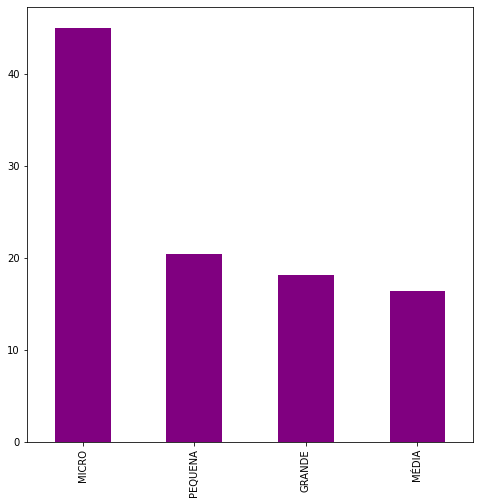

In [ ]:
#Verificando a distribuição dos financiamentos por porte do cliente
graf = operacoes['porte_do_cliente'].value_counts(normalize = True).mul(100).plot.bar(color = 'purple', figsize = (8,8));

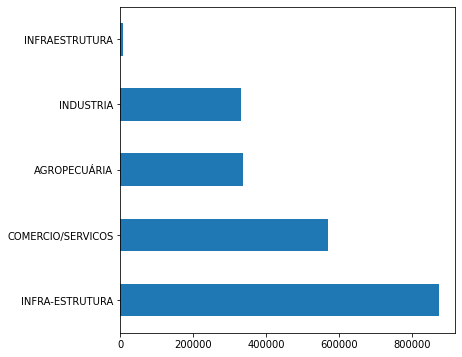

In [ ]:
#Verificando a distribuição dos financiamentos por setor do banco
operacoes['setor_bndes'].value_counts().plot.barh(figsize = (6,6));

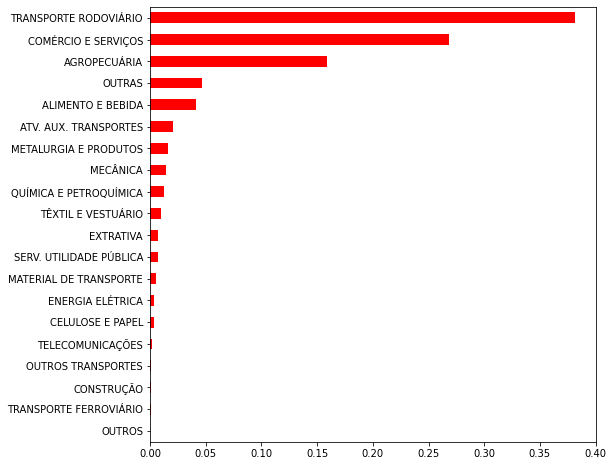

In [ ]:
#Verificando a distribuição dos financiamentos por subsetor do banco
operacoes['subsetor_bndes'].value_counts(normalize = True).sort_values().plot.barh(color = 'red', figsize = (8,8));


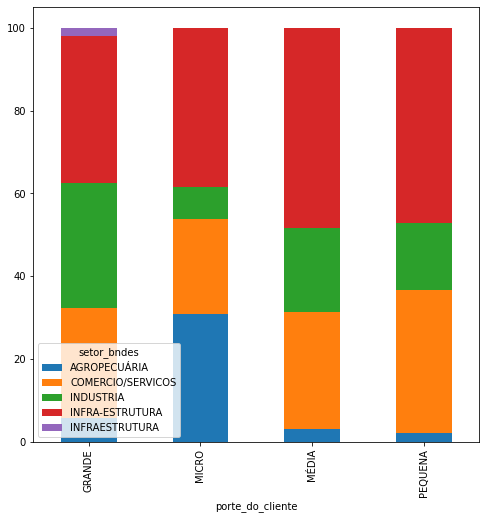

In [ ]:
#Crosstab entre forma de apoio e tipo de operação
#pd.crosstab(operacoes['porte_do_cliente'],operacoes['setor_bndes'],normalize = 'index').mul(100)
pd.crosstab(operacoes['porte_do_cliente'],operacoes['setor_bndes'],
            normalize = 'index').mul(100).plot(kind='bar', stacked=True,
                                               figsize = (8,8));

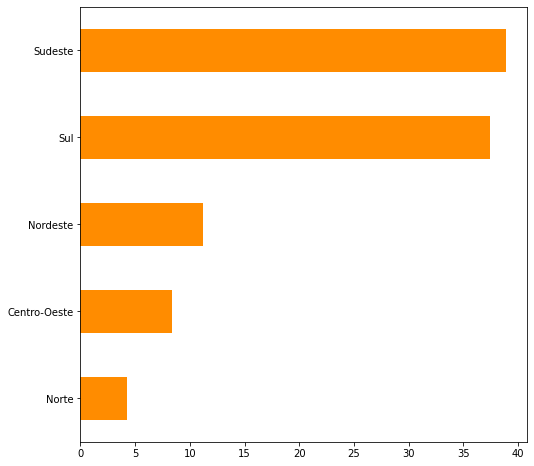

In [ ]:
#Verificando a distribuição dos financiamentos por regiões do Brasil
operacoes['NM_REGIAO'].value_counts(normalize = True).mul(100).sort_values().plot(kind = 'barh', color = 'darkorange', figsize = (8,8));

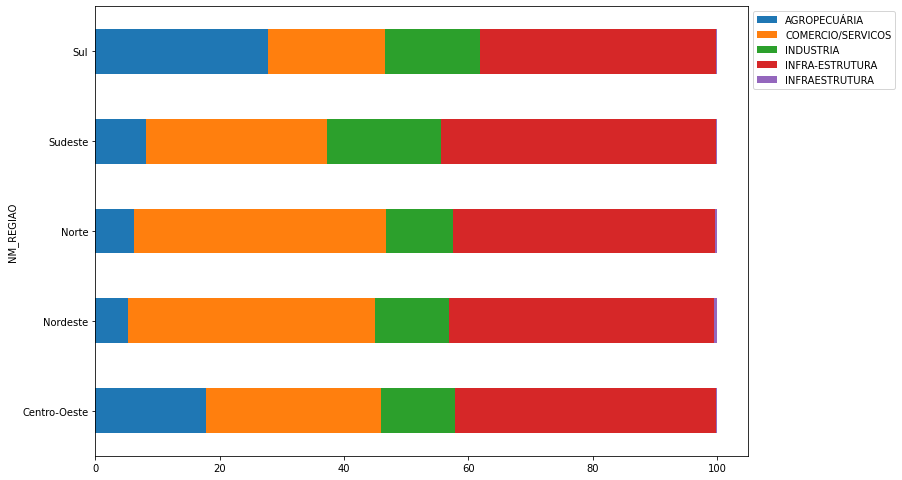

In [ ]:
#Crosstab entre região do Brasil e setor do banco onde foi realizado o financiamento
pd.crosstab(operacoes['NM_REGIAO'],operacoes['setor_bndes'],normalize = 'index').mul(100).plot(kind='barh', stacked=True, figsize = (11.7, 8.27)).legend(bbox_to_anchor=(1.0, 1.0));

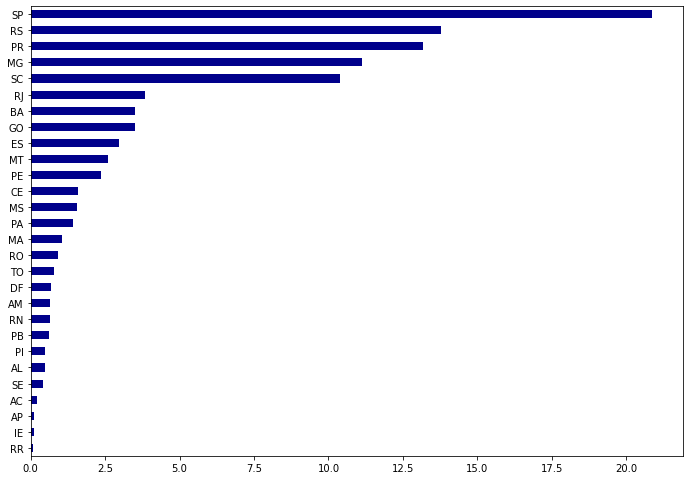

In [ ]:
#Verificando a distribuição dos financiamentos por UF do cliente
operacoes['uf'].value_counts(normalize = True).mul(100).sort_values().plot(kind = 'barh', color = 'darkblue', figsize = (11.7, 8.27));

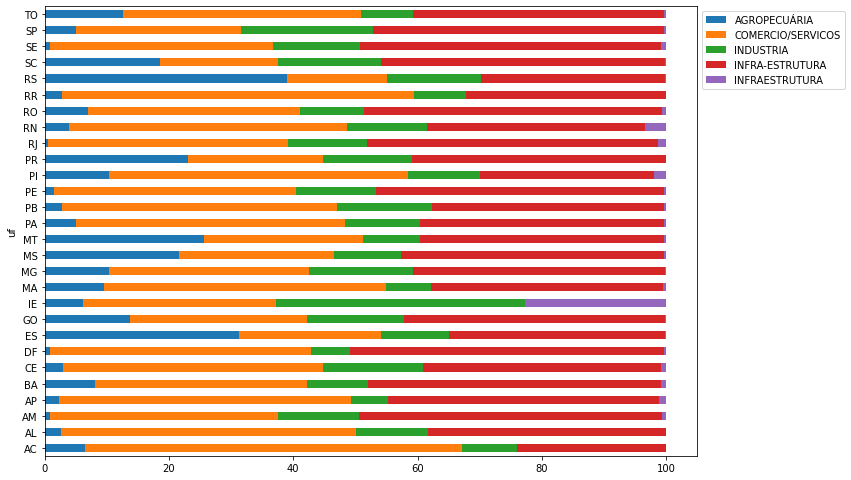

In [ ]:
#Crosstab entre Estado do Brasil e setor do banco onde foi realizado o financiamento
pd.crosstab(operacoes['uf'],operacoes['setor_bndes'],normalize = 'index').mul(100).plot(kind='barh', stacked=True, figsize = (11.7, 8.27)).legend(bbox_to_anchor=(1.0, 1.0));

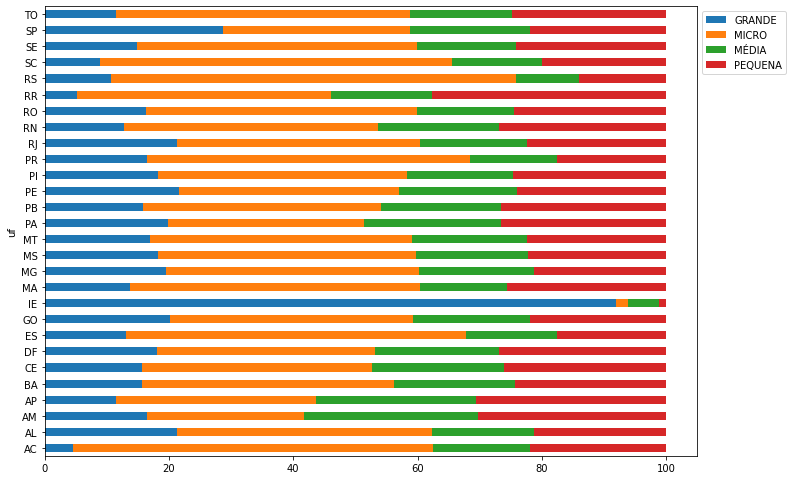

In [ ]:
#Crosstab entre Estado do Brasil e porte do cliente que realizou o financiamento
pd.crosstab(operacoes['uf'],operacoes['porte_do_cliente'],normalize = 'index').mul(100).plot(kind='barh', stacked=True, figsize = (11.7, 8.27)).legend(bbox_to_anchor=(1.0, 1.0));

In [ ]:
# Gerando estatisticas descritivas de variaveis numericas para df nao automatico
operacoes.describe(percentiles=[.05,.1,.25,.5,.75,0.9,0.95]).round()

,valor_da_operacao_em_reais,valor_desembolsado_reais,juros,prazo_carencia_meses,prazo_amortizacao_meses,CD_MUN,longitude,latitude,CD_GEOCUF,CD_REGIAO
count,2.117957e+06,2.102065e+06,2117521.0,2117957.0,2117957.0,2111448.0,2111448.0,2111448.0,2111448.0,2111448.0
mean,7.087630e+05,6.381130e+05,6.0,6.0,54.0,3663847.0,-48.0,-21.0,36.0,3.0
std,2.009595e+07,1.841130e+07,3.0,7.0,20.0,836941.0,5.0,7.0,8.0,1.0
min,8.000000e+00,0.000000e+00,0.0,0.0,0.0,1100015.0,-73.0,-34.0,11.0,1.0
5%,5.237000e+03,5.100000e+03,2.0,0.0,24.0,2111300.0,-55.0,-30.0,21.0,2.0
10%,1.085000e+04,1.070000e+04,3.0,0.0,33.0,2611101.0,-54.0,-29.0,26.0,2.0
25%,4.240000e+04,4.200000e+04,4.0,3.0,45.0,3167202.0,-52.0,-26.0,31.0,3.0
50%,1.150000e+05,1.138500e+05,5.0,3.0,54.0,3550308.0,-49.0,-23.0,35.0,3.0
75%,2.400000e+05,2.380000e+05,7.0,6.0,57.0,4213401.0,-45.0,-19.0,42.0,4.0
90%,5.000000e+05,5.000000e+05,9.0,12.0,72.0,4320263.0,-40.0,-10.0,43.0,4.0


In [ ]:
operacoes[operacoes['juros'] > 30]

,cliente,cpf_cnpj,uf,municipio,municipio_codigo,data_da_contratacao,valor_da_operacao_em_reais,valor_desembolsado_reais,fonte_de_recurso_desembolsos,custo_financeiro,juros,prazo_carencia_meses,prazo_amortizacao_meses,modalidade_de_apoio,forma_de_apoio,produto,instrumento_financeiro,inovacao,area_operacional,setor_cnae,subsetor_cnae_agrupado,subsetor_cnae_codigo,subsetor_cnae_nome,setor_bndes,subsetor_bndes,porte_do_cliente,natureza_do_cliente,instituicao_financeira_credenciada,cnpj_do_agente_financeiro,situacao_da_operacao,tipo_operacao,CD_MUN,NM_MUN,SIGLA_UF,longitude,latitude,NM_UF,CD_GEOCUF,NM_REGIAO,CD_REGIAO
22371,TRANSPORTES MAGUETA LTDA,**.*60.549/0001-**,SP,SAO PAULO,3550308,2002-01-23,55476.0,55476.0,RECURSOS LIVRES - PRÓPRIOS,TJLP,53.0,0,48,REEMBOLSÁVEL,INDIRETA,BNDES FINAME,OUTROS,NÃO,AREA DE OPERACOES E CANAIS DIGITAIS,COMERCIO E SERVICOS,Transporte terrestre,H4922100,TRANSP RODOV COL PASSAG C/ITINERARIO FXO INTER...,INFRA-ESTRUTURA,TRANSPORTE RODOVIÁRIO,MICRO,PRIVADA,BANCO BRADESCO S.A.,60.746.948.0001-12,LIQUIDADA,AUTOMÁTICA,3550308.0,São Paulo,SP,-46.64811,-23.65008,São Paulo,35.0,Sudeste,3.0


Text(0.5, 1.0, 'Prazo de Amortização')

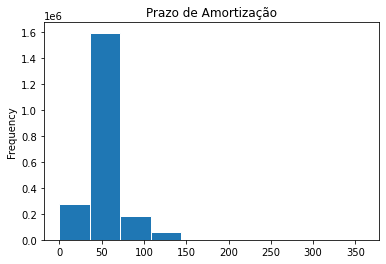

In [ ]:
#Histogramas prazo de amortização
operacoes['prazo_amortizacao_meses'].plot.hist(edgecolor = 'white')
plt.title("Prazo de Amortização")

Text(0.5, 1.0, 'Juros')

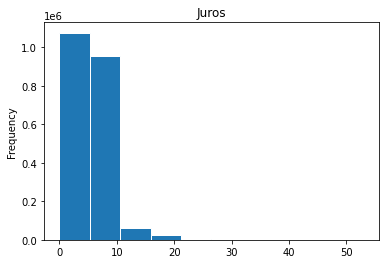

In [ ]:
#Histogramas Juros
operacoes['juros'].plot.hist(edgecolor = 'white');
plt.title("Juros")

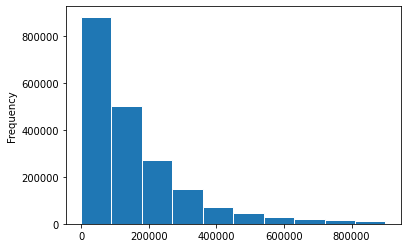

In [ ]:
#Histogramas Juros
#Truncando para conseguir visualizar melhor
operacoes[operacoes['valor_da_operacao_em_reais'] < 9e+05]['valor_da_operacao_em_reais'].plot.hist(edgecolor = 'white')

#### **Analise por 'Produtos'**

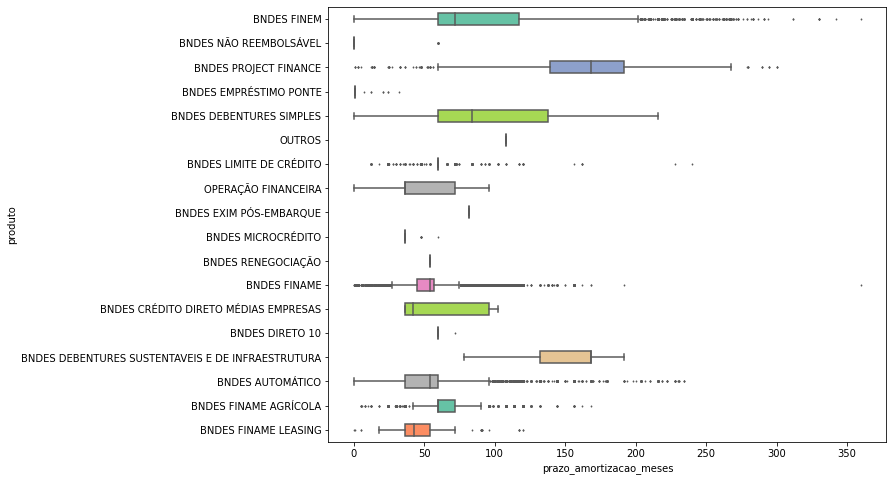

In [ ]:
#Prazo de amortização por produto contratado
plt.figure(figsize = (10,8))
sns.boxplot(data=operacoes, x = 'prazo_amortizacao_meses', y = 'produto', 
            orient = 'h', palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1)
plt.show()


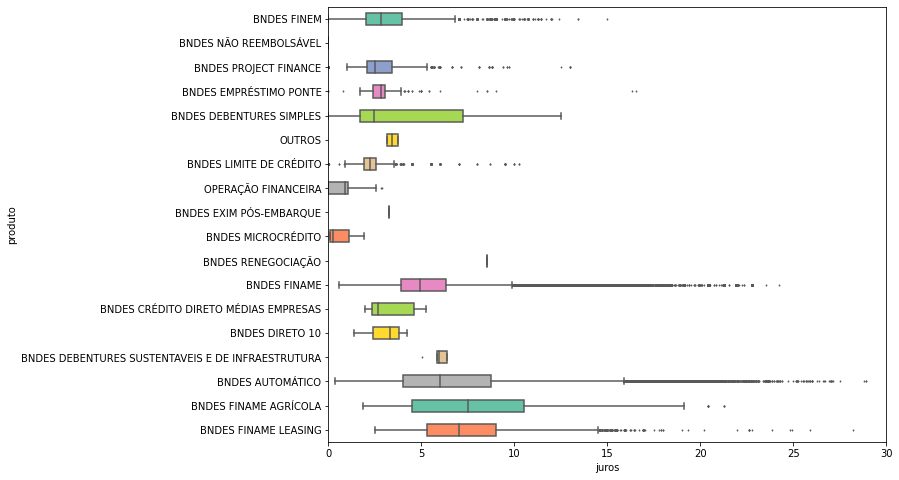

In [ ]:
#Juros por produto contratado
plt.figure(figsize = (10,8))
sns.boxplot(data=operacoes, x = 'juros', y = 'produto', 
            orient = 'h', palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1)
plt.xlim([0, 30])  
plt.show()


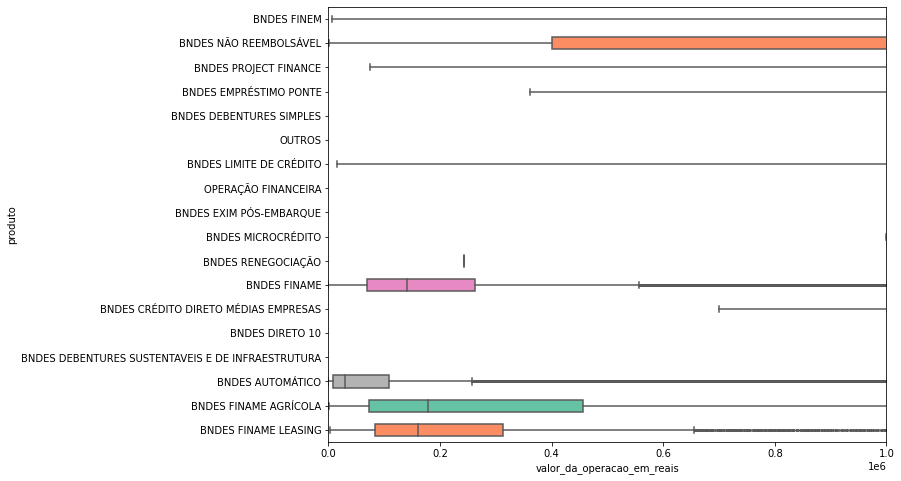

In [ ]:
#Valor das operações por produto contratado
plt.figure(figsize = (10,8))
sns.boxplot(data=operacoes, x = 'valor_da_operacao_em_reais', y = 'produto', 
            orient = 'h', palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1)
plt.xlim([0, 1000000])  
plt.show()

In [ ]:
# Análise dos valores contratados por produto
operacoes[['produto','valor_da_operacao_em_reais']].groupby('produto').describe(percentiles=[.05,.1,.25,.5,.75,0.9,0.95])

valor_da_operacao_em_reais  ...              
                                                                       count  ...           max
produto                                                                       ...              
BNDES AUTOMÁTICO                                                    524267.0  ...  8.800960e+07
BNDES CRÉDITO DIRETO MÉDIAS EMPRESAS                                    40.0  ...  1.410000e+07
BNDES DEBENTURES SIMPLES                                               211.0  ...  7.757296e+08
BNDES DEBENTURES SUSTENTAVEIS E DE INFRAESTRUTURA                        5.0  ...  5.500000e+08
BNDES DIRETO 10                                                         13.0  ...  1.000000e+07
BNDES EMPRÉSTIMO PONTE                                                 224.0  ...  1.500000e+09
BNDES EXIM PÓS-EMBARQUE                                                  4.0  ...  2.469467e+09
BNDES FINAME                                                       1534885.0  ...  1.000000e+09
BNDES FINAME AGRÍCOLA                                                14678.0  ...  1.769162e+07
BNDES FINAME LEASING                                                 24799.0  ...  1.976520e+07
BNDES FINEM                                                          14277.0  ...  9.889998e+09
BNDES LIMITE DE CRÉDITO                                               1535.0  ...  6.691259e+09
BNDES MICROCRÉDITO                                                      65.0  ...  1.663000e+08
BNDES NÃO REEMBOLSÁVEL                                                1274.0  ...  1.402640e+08
BNDES PROJECT FINANCE                                                 1623.0  ...  3.283918e+09
BNDES RENEGOCIAÇÃO                                                       1.0  ...  2.421854e+05
OPERAÇÃO FINANCEIRA                                                     40.0  ...  5.000000e+09
OUTROS                                                                  16.0  ...  2.447868e+07

[18 rows x 12 columns]

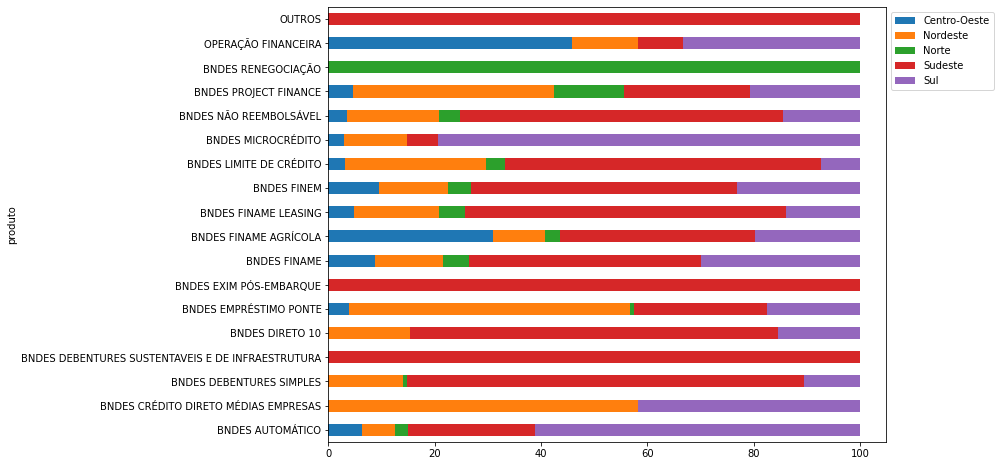

In [ ]:
#Crosstab entre região do Brasil e tipo de operação
pd.crosstab(operacoes['produto'],operacoes['NM_REGIAO'],
            normalize = 'index').mul(100).plot(kind='barh', stacked=True,
                    figsize = (10, 8)).legend(bbox_to_anchor=(1.0, 1.0));

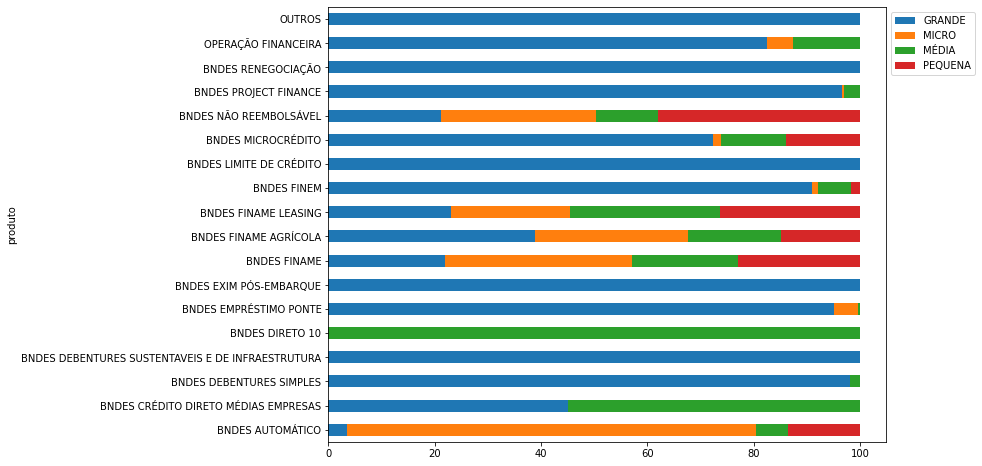

In [ ]:
# Porte do Cliente por produto contratado
pd.crosstab(operacoes['produto'],operacoes['porte_do_cliente'], 
            normalize = 'index').mul(100).plot(kind = 'barh', stacked = True, 
                    figsize = (10, 8)).legend(bbox_to_anchor=(1.0, 1.0));

#### **Analise por porte da Empresa**

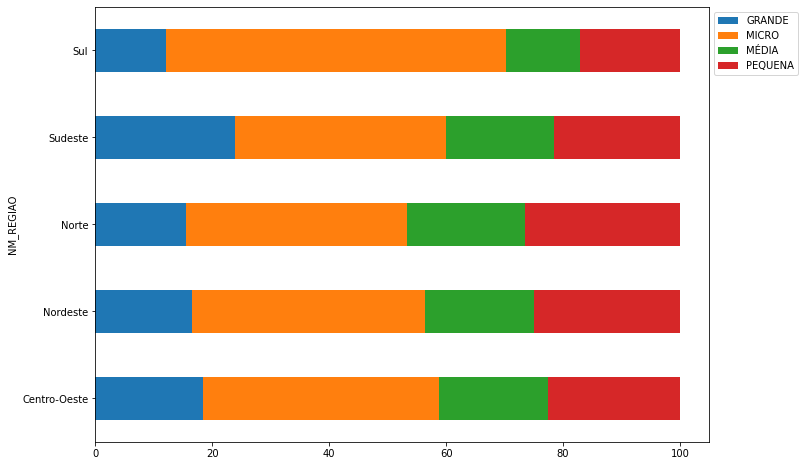

In [ ]:
#Crosstab entre região do Brasil e porte da empresa
pd.crosstab(operacoes['NM_REGIAO'],operacoes['porte_do_cliente'],normalize = 'index').mul(100).plot(kind='barh', stacked=True, figsize = (11, 8)).legend(bbox_to_anchor=(1.0, 1.0));

In [ ]:
# Produto contratado por Porte do cliente
pd.crosstab(operacoes['produto'], operacoes['porte_do_cliente'],normalize = 'columns',margins=True).mul(100).round(4).astype(str) + '%'


porte_do_cliente,GRANDE,MICRO,MÉDIA,PEQUENA,All
produto,,,,,
BNDES AUTOMÁTICO,4.8436%,42.2864%,9.2058%,16.3063%,24.7534%
BNDES CRÉDITO DIRETO MÉDIAS EMPRESAS,0.0047%,0.0%,0.0063%,0.0%,0.0019%
BNDES DEBENTURES SIMPLES,0.0539%,0.0%,0.0012%,0.0%,0.01%
BNDES DEBENTURES SUSTENTAVEIS E DE INFRAESTRUTURA,0.0013%,0.0%,0.0%,0.0%,0.0002%
BNDES DIRETO 10,0.0%,0.0%,0.0037%,0.0%,0.0006%
BNDES EMPRÉSTIMO PONTE,0.0555%,0.001%,0.0003%,0.0%,0.0106%
BNDES EXIM PÓS-EMBARQUE,0.001%,0.0%,0.0%,0.0%,0.0002%
BNDES FINAME,87.7749%,56.6287%,87.7094%,81.5241%,72.4701%
BNDES FINAME AGRÍCOLA,1.4849%,0.4449%,0.7391%,0.5002%,0.693%


In [ ]:
#Verificando estatísticas dos juros médio por porte do cliente
operacoes[['porte_do_cliente','juros']].groupby('porte_do_cliente').describe(percentiles=[.05,.1,.25,.5,.75,0.9,0.95])

juros                           ...                        
                     count      mean       std  min  ...  75%   90%    95%   max
porte_do_cliente                                     ...                        
GRANDE            383659.0  5.142519  2.616099  0.0  ...  6.0  8.50  10.00  24.9
MICRO             953014.0  5.723360  2.833558  0.0  ...  7.7  8.75   9.87  53.0
MÉDIA             347600.0  5.459058  2.793265  0.0  ...  6.5  8.50  10.00  27.1
PEQUENA           433248.0  5.982295  2.987807  0.0  ...  7.0  9.50  12.50  28.8

[4 rows x 12 columns]

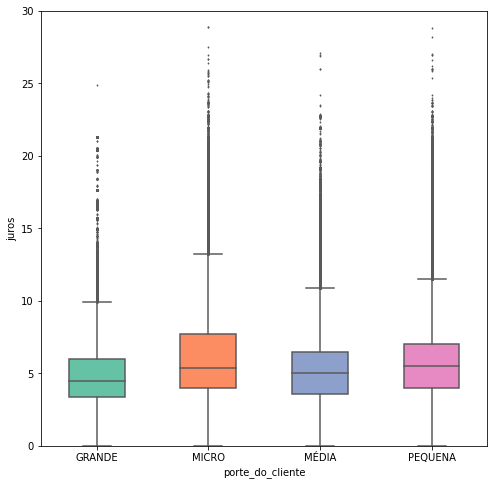

In [ ]:
#Juros por portes do cliente
plt.figure(figsize = (8,8))
sns.boxplot(data=operacoes, y = 'juros', x = 'porte_do_cliente', 
            palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1)
plt.ylim([0, 30])  
plt.show()

In [ ]:
#Verificando estatísticas dos prazos de amortização por porte do cliente
operacoes[['porte_do_cliente','prazo_amortizacao_meses']].groupby('porte_do_cliente').describe(percentiles=[.05,.1,.25,.5,.75,0.9,0.95])

prazo_amortizacao_meses             ...              
                                   count       mean  ...    95%    max
porte_do_cliente                                     ...              
GRANDE                          383930.0  56.731922  ...  102.0  360.0
MICRO                           953053.0  56.167824  ...   96.0  231.0
MÉDIA                           347706.0  50.288419  ...   84.0  360.0
PEQUENA                         433268.0  50.788332  ...   84.0  231.0

[4 rows x 12 columns]

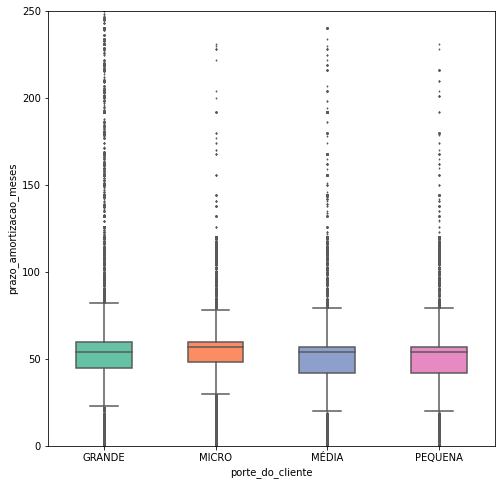

In [ ]:
#Prazo de amortização por porte do cliente
plt.figure(figsize = (8,8))
sns.boxplot(data=operacoes, y = 'prazo_amortizacao_meses', x = 'porte_do_cliente', 
            palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1)
plt.ylim([0, 250])  
plt.show()

In [ ]:
#Verificando estatísticas dos Valores dos financiamentos por porte do cliente
operacoes[['porte_do_cliente','valor_da_operacao_em_reais']].groupby('porte_do_cliente').describe(percentiles=[.05,.1,.25,.5,.75,0.9,0.95])

valor_da_operacao_em_reais  ...              
                                      count  ...           max
porte_do_cliente                             ...              
GRANDE                             383930.0  ...  9.889998e+09
MICRO                              953053.0  ...  1.142667e+08
MÉDIA                              347706.0  ...  2.653720e+09
PEQUENA                            433268.0  ...  1.000000e+08

[4 rows x 12 columns]

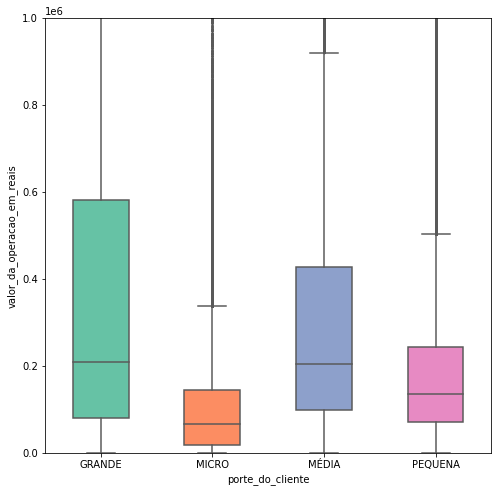

In [ ]:
#Valor das operações por porte dos clientes
plt.figure(figsize = (8,8))
sns.boxplot(data=operacoes, y = 'valor_da_operacao_em_reais', x = 'porte_do_cliente', 
            palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1)
plt.ylim([0, 1e+06])  
plt.show()

In [ ]:
# UF do Cliente por Porte do Cliente
pd.crosstab(operacoes['uf'],operacoes['porte_do_cliente'],normalize = 'index',margins=True).mul(100).round(2).astype(str) + '%'

porte_do_cliente,GRANDE,MICRO,MÉDIA,PEQUENA
uf,,,,
AC,4.57%,57.96%,15.57%,21.9%
AL,21.29%,41.01%,16.48%,21.21%
AM,16.42%,25.24%,28.09%,30.26%
AP,11.44%,32.21%,25.7%,30.64%
BA,15.64%,40.61%,19.36%,24.4%
CE,15.62%,36.96%,21.23%,26.19%
DF,18.13%,34.99%,19.95%,26.94%
ES,13.09%,54.75%,14.62%,17.54%
GO,20.09%,39.19%,18.73%,21.99%


#### **Analise por 'Unidade da Federação' do Brasil**

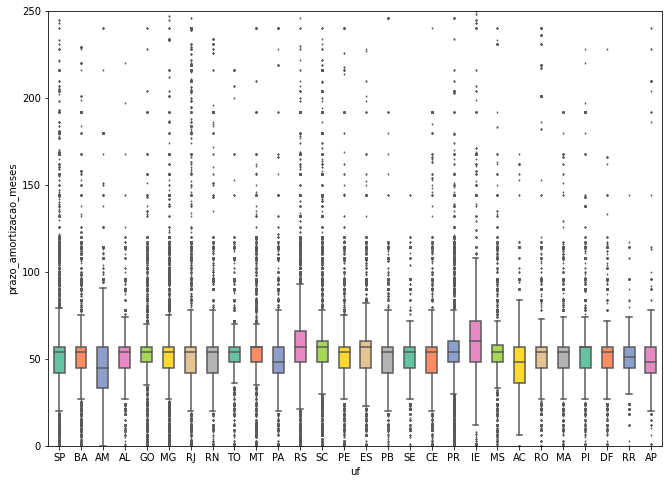

In [ ]:
#Prazo de amortização por UF
plt.figure(figsize = (11,8))
sns.boxplot(data=operacoes, y = 'prazo_amortizacao_meses', x = 'uf', 
            palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1)
plt.ylim([0, 250])  
plt.show()

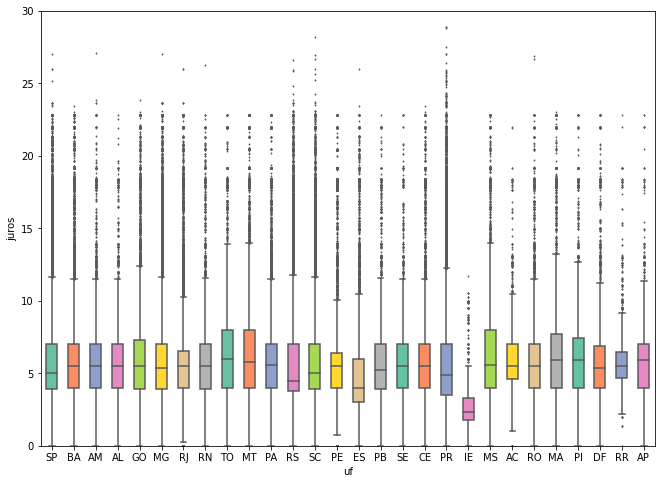

In [ ]:
#Prazo de amortização por UF
plt.figure(figsize = (11,8))
sns.boxplot(data=operacoes, y = 'juros', x = 'uf', 
            palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1)
plt.ylim([0, 30])  
plt.show()

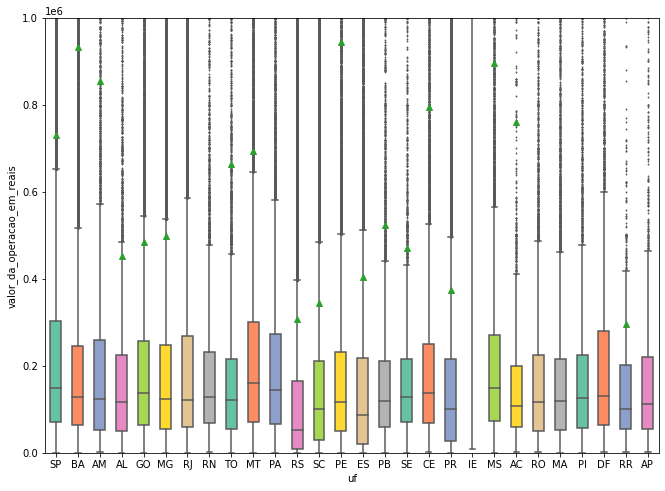

In [ ]:
#Valor das operações por UF
plt.figure(figsize = (11,8))
sns.boxplot(data=operacoes, y = 'valor_da_operacao_em_reais', x = 'uf', 
            palette = 'Set2', fliersize = 1, 
            width=0.5, saturation=1, showmeans=True)
plt.ylim([0, 1000000])  
plt.show()

In [ ]:
# Agora vamos fazer um mapa com a média da taxa de juros por Estado do Brasil

# Calculando a média da variável target por uf 
df_uf = operacoes[['CD_GEOCUF','juros']].groupby('CD_GEOCUF',as_index=False).mean()
df_uf

,CD_GEOCUF,juros
0,11.0,5.862780
1,12.0,6.194338
2,13.0,5.933271
3,14.0,5.953320
4,15.0,6.148632
5,16.0,6.100460
6,17.0,6.271963
7,21.0,6.313385
8,22.0,6.189494
9,23.0,5.870472


In [ ]:
# transformando a variavel com codigo da UF para ficar igual a do mapa
df_uf['CD_GEOCUF'] = df_uf['CD_GEOCUF'].astype(int).astype(str)
df_uf

,CD_GEOCUF,juros
0,11,5.862780
1,12,6.194338
2,13,5.933271
3,14,5.953320
4,15,6.148632
5,16,6.100460
6,17,6.271963
7,21,6.313385
8,22,6.189494
9,23,5.870472


In [ ]:
# Criar o mapa base 
mapa = folium.Map(width=800, height=450, location=[-12.97, -38.51], zoom_start=3)
mapa

In [ ]:
# Lendo o arquivo georreferenciado no formato JSON com os poligonos dos Estados
shape_UF = '/content/drive/Shareddrives/Comunidade/Curso DDS 2.0/Projetos/BNDES_Python_para_Data_Science/data/BRUFE250GC_SIR.json'

#Criar a camada Choroplet
folium.Choropleth(
    geo_data=shape_UF,
    name='choropleth',
    data=df_uf,
    columns=['CD_GEOCUF', 'juros'],
    key_on='feature.properties.CD_GEOCUF',
    fill_color='Blues',
    fill_opacity=0.7,
    line_opacity=0.9,
    legend_name='Taxa de Juros (em %)'
).add_to(mapa)

# Renderizando o mapa
mapa


#### **Analise por 'Grandes Regiões' do Brasil**

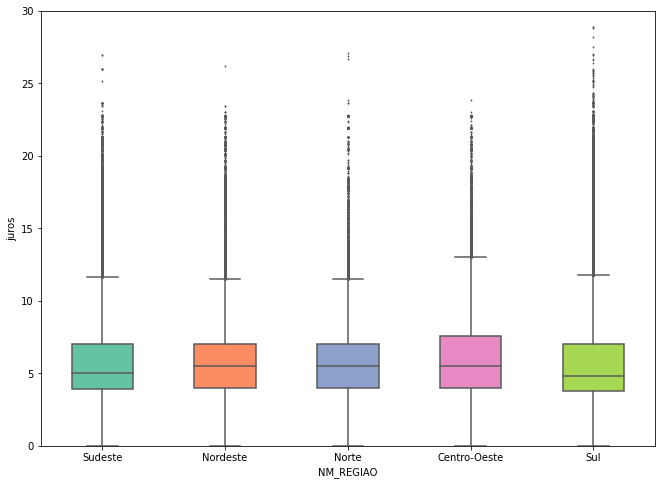

In [ ]:
#Juros por região do Brasil
plt.figure(figsize = (11,8))
sns.boxplot(data=operacoes, y = 'juros', x = 'NM_REGIAO', 
            palette = 'Set2', fliersize = 1, orient="v", 
            width=0.5, saturation=1)
plt.ylim([0, 30])  
plt.show()

In [ ]:
# Análise dos valores contratados por região do Brasil
operacoes[['NM_REGIAO','valor_da_operacao_em_reais']].groupby('NM_REGIAO').describe(percentiles=[.05,.1,.25,.5,.75,0.9,0.95])

valor_da_operacao_em_reais                 ...                         
                                  count           mean  ...        95%           max
NM_REGIAO                                               ...                         
Centro-Oeste                   176054.0  557353.764062  ...   963000.0  2.000000e+09
Nordeste                       235742.0  672014.098925  ...   860000.0  9.889998e+09
Norte                           89352.0  758720.473644  ...   774000.0  2.489500e+09
Sudeste                        820519.0  631255.970411  ...  1215000.0  6.691259e+09
Sul                            789781.0  301021.636493  ...   670500.0  3.000000e+09

[5 rows x 12 columns]

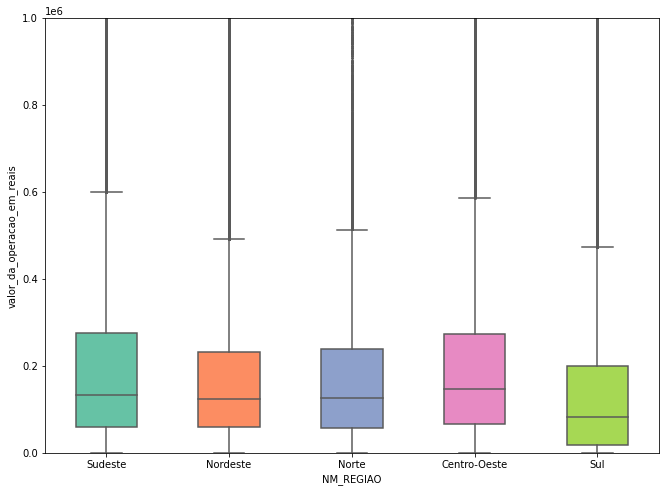

In [ ]:
#Valor das operações por região do Brasil
plt.figure(figsize = (11,8))
sns.boxplot(data=operacoes, y = 'valor_da_operacao_em_reais', x = 'NM_REGIAO', 
            palette = 'Set2', fliersize = 1, orient="v", 
            width=0.5, saturation=1)
plt.ylim([0, 1000000])  
plt.show()

In [ ]:
# Mapa com soma dos valores das operações por regioes do Brasil

# Calculando a média da variável target por uf 
df_regiao = operacoes[['NM_REGIAO','valor_da_operacao_em_reais']].groupby('NM_REGIAO',as_index=False).sum()

#renomeando para ficar igual a shape
df_regiao.rename(columns={'NM_REGIAO': 'NOME1'}, inplace = True)

# Criar o mapa base
mapa_regiao = folium.Map(width=800, height=450, location=[-12.97, -38.51], zoom_start=3)

# Lendo o arquivo georreferenciado no formato JSON
shape_regiao = '/content/drive/Shareddrives/Comunidade/Curso DDS 2.0/Projetos/BNDES_Python_para_Data_Science/data/grandes_regioes_json.geojson'

#Criar a camada Choroplet
folium.Choropleth(
    geo_data = shape_regiao,
    name ='choropleth',
    data = df_regiao,
    columns=['NOME1', 'valor_da_operacao_em_reais'],
    key_on='feature.properties.NOME1',
    fill_color='Blues',
    fill_opacity=0.7,
    line_opacity=0.9,
    legend_name='Total das operações (em Reais)',
    highlight = True 
).add_to(mapa_regiao)

#renderizando o mapa
mapa_regiao

#### **Analise por 'Inovação'**

In [ ]:
#Verificando juros médio estratificado por operações para inovação (ou não)
operacoes[['inovacao','juros']].groupby('inovacao').describe(percentiles=[.05,.1,.25,.5,.75,0.9,0.95])

juros                           ...                         
              count      mean       std  min  ...   75%   90%   95%    max
inovacao                                      ...                         
NÃO       2115980.0  5.629340  2.834573  0.0  ...  7.00  8.75  10.0  53.00
SIM          1541.0  3.393674  2.724269  0.0  ...  4.59  6.50   7.0  20.46

[2 rows x 12 columns]

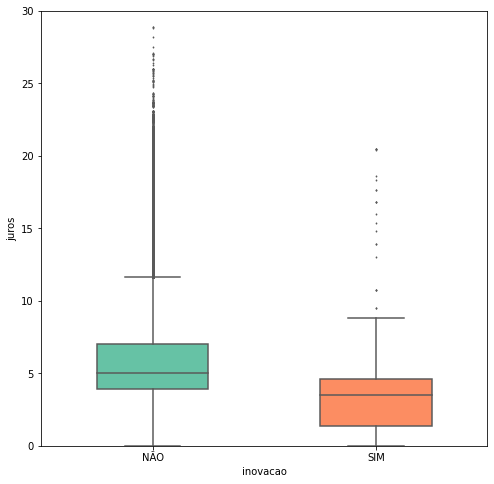

In [ ]:
#Juros por operações para inovação (ou não)
plt.figure(figsize = (8,8))
sns.boxplot(data=operacoes, y = 'juros', x = 'inovacao', 
            palette = 'Set2', fliersize = 1, orient="v", 
            width=0.5, saturation=1)
plt.ylim([0, 30])  
plt.show()

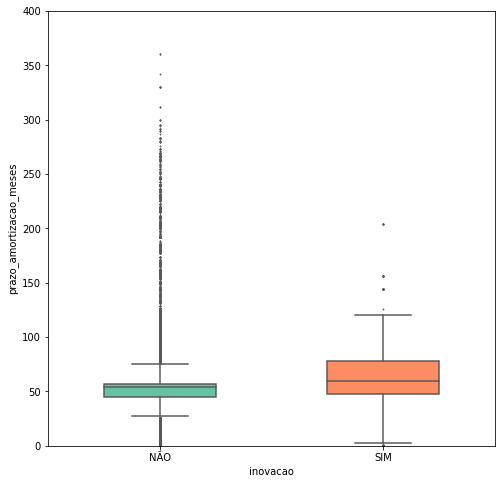

In [ ]:
#Prazo de amortização por operações para inovação (ou não)
plt.figure(figsize = (8,8))
sns.boxplot(data=operacoes, y = 'prazo_amortizacao_meses', x = 'inovacao', 
            palette = 'Set2', fliersize = 1, orient="v", 
            width=0.5, saturation=1)
plt.ylim([0, 400])  
plt.show()

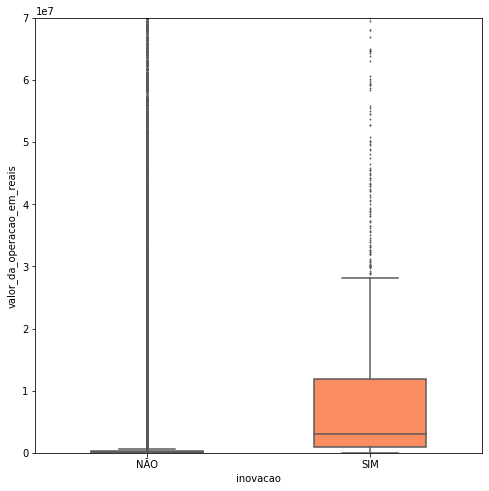

In [ ]:
#Valores das operações por operações para inovação (ou não)
plt.figure(figsize = (8,8))
sns.boxplot(data=operacoes, y = 'valor_da_operacao_em_reais', x = 'inovacao', 
            palette = 'Set2', fliersize = 1, orient="v", 
            width=0.5, saturation=1)
plt.ylim([0, 70000000])  
plt.show()

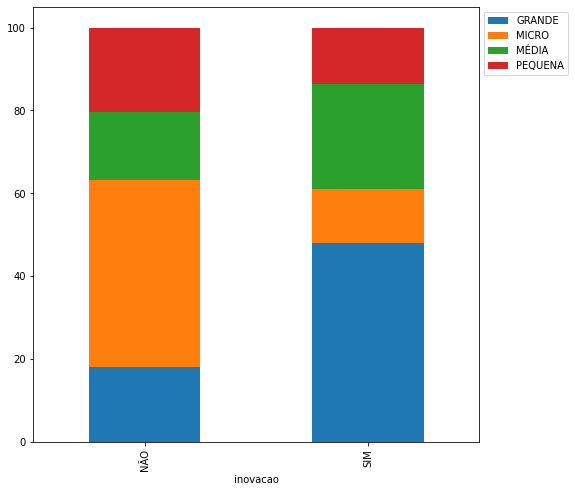

In [ ]:
# Porte do Cliente por operações para inovação (ou não)
pd.crosstab(operacoes['inovacao'],operacoes['porte_do_cliente'],normalize = 'index').mul(100).plot(kind='bar', stacked=True, figsize = (8, 8)).legend(bbox_to_anchor=(1.0, 1.0));

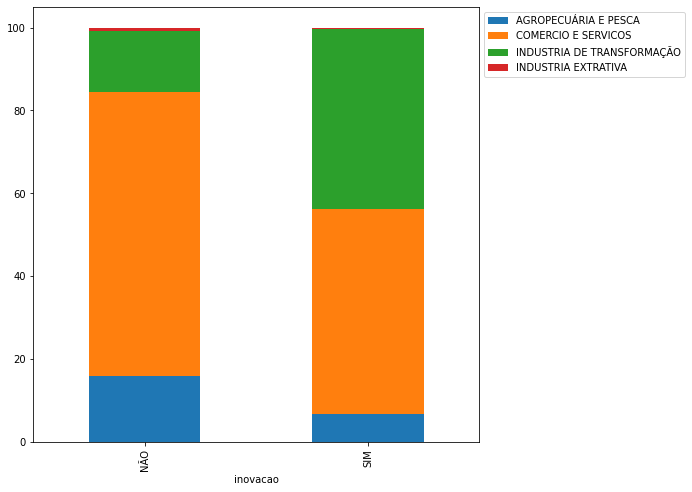

In [ ]:
# Setor CNAE por operações para inovação (ou não)
pd.crosstab(operacoes['inovacao'],operacoes['setor_cnae'],normalize = 'index').mul(100).plot(kind='bar', stacked=True, figsize = (8, 8)).legend(bbox_to_anchor=(1.0, 1.0));

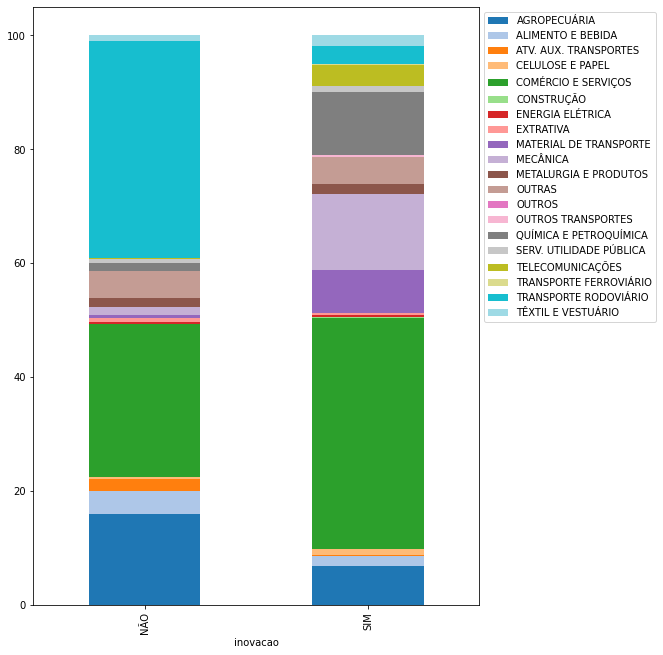

In [ ]:
# Subsetor por operações para inovação (ou não)
pd.crosstab(operacoes['inovacao'],operacoes['subsetor_bndes'],normalize = 'index').mul(100).plot(kind='bar', stacked=True, figsize = (8, 11), colormap = 'tab20').legend(bbox_to_anchor=(1.0, 1.0));

In [ ]:
# Subsetor por operações para inovação (ou não)
pd.crosstab(operacoes['subsetor_bndes'],operacoes['inovacao'], normalize = 'columns', margins= True).mul(100)

inovacao,NÃO,SIM,All
subsetor_bndes,,,
AGROPECUÁRIA,15.863469,6.813757,15.856885
ALIMENTO E BEBIDA,4.168415,1.817002,4.166704
ATV. AUX. TRANSPORTES,2.058149,0.064893,2.056699
CELULOSE E PAPEL,0.359192,1.168073,0.359781
COMÉRCIO E SERVIÇOS,26.819019,40.493186,26.828968
CONSTRUÇÃO,0.059204,0.259572,0.059350
ENERGIA ELÉTRICA,0.363208,0.259572,0.363133
EXTRATIVA,0.717534,0.324465,0.717248
MATERIAL DE TRANSPORTE,0.499051,7.657365,0.504260


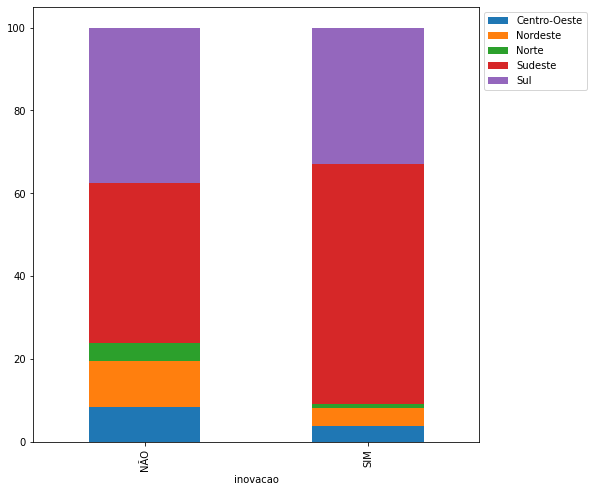

In [ ]:
# Região do Brasil por operações para inovação (ou não)
pd.crosstab(operacoes['inovacao'],operacoes['NM_REGIAO'],normalize = 'index').mul(100).plot(kind='bar', stacked=True, figsize = (8, 8)).legend(bbox_to_anchor=(1.0, 1.0));

In [ ]:
# UF do Cliente por operações para inovação (ou não)
pd.crosstab(operacoes['uf'],operacoes['inovacao'],normalize = 'columns',margins=True).mul(100).round(2).astype(str) + '%'

inovacao,NÃO,SIM,All
uf,,,
AC,0.22%,0.0%,0.22%
AL,0.47%,0.52%,0.47%
AM,0.65%,0.45%,0.65%
AP,0.11%,0.0%,0.11%
BA,3.51%,1.88%,3.51%
CE,1.6%,0.65%,1.6%
DF,0.69%,1.17%,0.69%
ES,2.98%,0.91%,2.98%
GO,3.5%,1.17%,3.49%


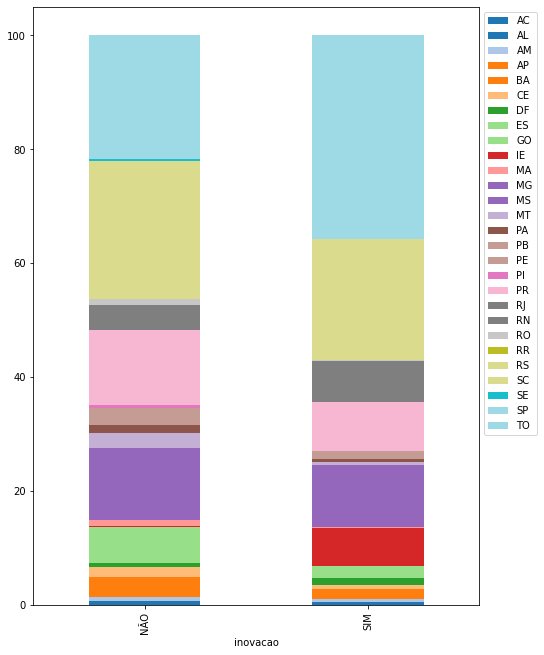

In [ ]:
# UF por operações para inovação (ou não)
pd.crosstab(operacoes['inovacao'],operacoes['uf'],normalize = 'index').mul(100).plot(kind='bar', stacked=True, figsize = (8, 11), colormap = 'tab20').legend(bbox_to_anchor=(1.0, 1.0));

In [ ]:
# Filtrando somente as operacoes para inovacao
operacoes_inovacao = operacoes.loc[operacoes['inovacao']=='SIM']

# Calculando o juros media e total financiado por municipio 
df_valorop = operacoes_inovacao[['CD_MUN','valor_da_operacao_em_reais']].groupby('CD_MUN',as_index=False).sum()
df_juros = operacoes_inovacao[['CD_MUN','juros']].groupby('CD_MUN',as_index=False).mean()

#juntando os df de valor de operacoes com a media da taxa de juros
df_mapa = pd.merge( 
    left = df_valorop, 
    right = df_juros, 
    left_on = 'CD_MUN',
    right_on = 'CD_MUN', 
    how='left'
)

#juntando com as geoinformacoes
df_mapa = pd.merge( 
    left = df_mapa, 
    right = geoinformacao, 
    left_on = 'CD_MUN',
    right_on = 'CD_MUN', 
    how='left'
)

# criando o rotulo dos pontos
df_mapa['rotulo'] = df_mapa['NM_MUN']+'-'+df_mapa['SIGLA_UF']+' | \n Valor = R$'+df_mapa['valor_da_operacao_em_reais'].astype('str')+' | \n taxa de juros media = '+df_mapa['juros'].round(2).astype('str')

# Criando o  mapa vazio
mapa_pontos = folium.Map(
    width=800, height=600,
    location=[-16.1237611, -59.9219642],
    zoom_start=4
)

# inserindo os pontos no mapa
for _, pontos in df_mapa.iterrows():
    folium.Marker(
      location = [pontos['latitude'] , pontos['longitude']], 
      popup= pontos['rotulo'],  
      tooltip="Clique aqui e saiba mais!",
      icon=folium.Icon(color='blue', icon="usd")
    ).add_to(mapa_pontos)

#renderizando o mapa
mapa_pontos